In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

**READING THE DATA FRAME**

*Context*

This dataset is originally from the National Institute of Diabetes and Digestive and Kidney Diseases. The objective of the dataset is to diagnostically predict whether or not a patient has diabetes, based on certain diagnostic measurements included in the dataset. Several constraints were placed on the selection of these instances from a larger database. In particular, all patients here are females at least 21 years old of Pima Indian heritage.

*Content*

The datasets consists of several medical predictor variables and one target variable, Outcome. Predictor variables includes the number of pregnancies the patient has had, their BMI, insulin level, age, and so on.

In [4]:
df = pd.read_csv('Data\diabetes.csv')
print(df.shape)
print(df.columns)
df.head()

(768, 9)
Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


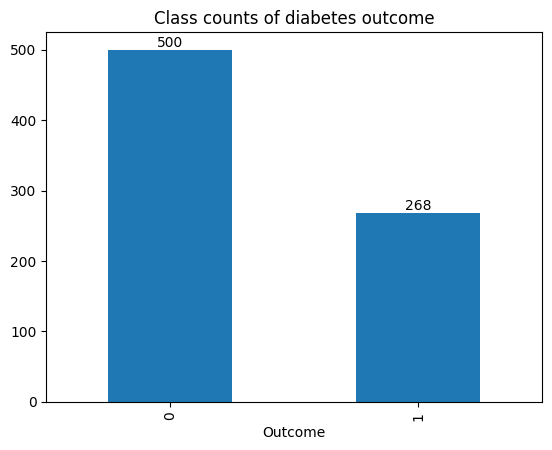

In [11]:

df['Outcome'].value_counts().plot(kind='bar')
# Add explict count for each class in the plot
for i, count in enumerate(df['Outcome'].value_counts()):
    plt.text(i, count, str(count), ha='center', va='bottom')

plt.title('Class counts of diabetes outcome')
plt.show()

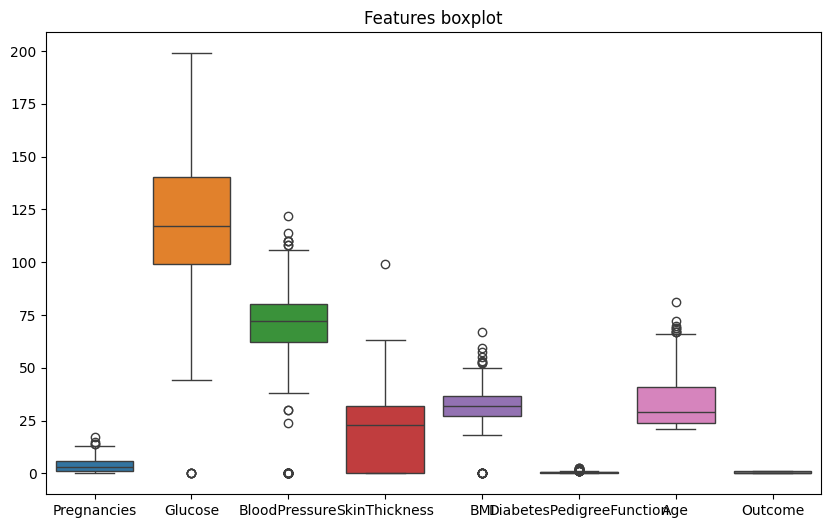

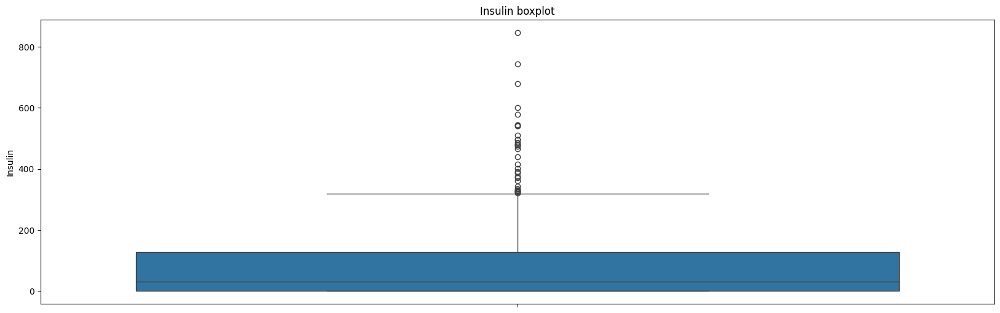

In [36]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df.drop('Insulin', axis=1))
plt.title('Features boxplot')
plt.show()

plt.figure(figsize=(20, 6))
sns.boxplot(data=df['Insulin'])
plt.title('Insulin boxplot')
plt.show()


Como pode ser visto acima o dataset em questão possui exclusivamente features numéricas, além disso o mesmo está desbalanceado com praticamente proporção 2:1.

Para futura avaliação dos modelos criarei uma versão do dataset com balanceamento utilizando o resample da biblioteca scikit-learn.

Será feita a separação de treino e teste com 75% para treino e 25% para teste.

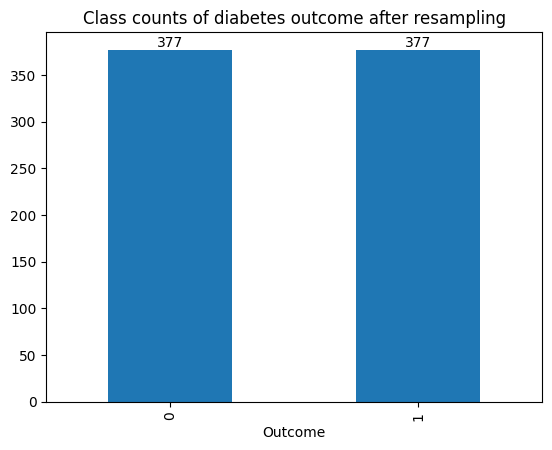

In [46]:
import pandas as pd
from sklearn.utils import resample
from sklearn.model_selection import train_test_split

X = df.drop(columns=['Outcome'])
Y = df['Outcome']
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=42)

df_train = pd.concat([X_train, Y_train], axis=1)
df_majority = df_train[df_train['Outcome'] == 0]
df_minority = df_train[df_train['Outcome'] == 1]

df_minority_upsampled = resample(df_minority, replace=True, n_samples=len(df_majority), random_state=42)

df_upsampled = pd.concat([df_majority, df_minority_upsampled])

X_train_upsampled = df_upsampled.drop(columns=['Outcome'])
Y_train_upsampled = df_upsampled['Outcome']

ax = df_upsampled['Outcome'].value_counts().plot(kind='bar')
for i, count in enumerate(df_upsampled['Outcome'].value_counts()):
    plt.text(i, count, str(count), ha='center', va='bottom')
plt.title('Class counts of diabetes outcome after resampling')
plt.show()

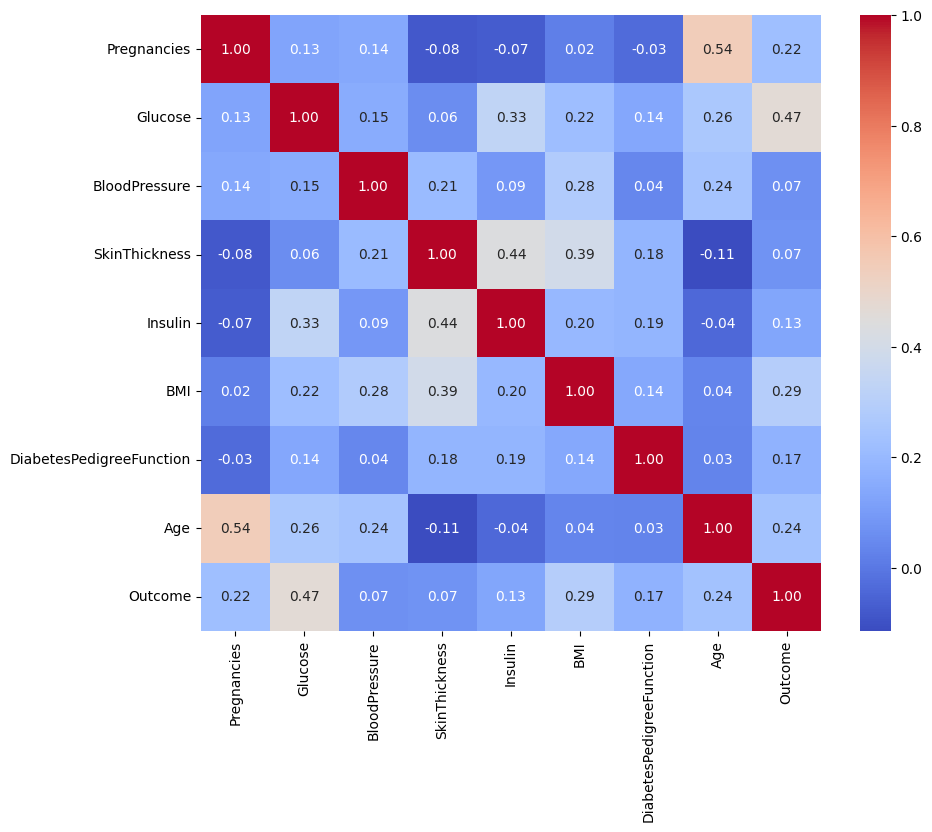

In [37]:
# Calculate the correlation matrix
correlation_matrix = df.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()


Como pode ser visto acima existe uma correlação consideravelmente alta entre glicose e o diagnóstico e entre a idade e número de gravidez (naturalmente, visto que mulheres mais velhas terão muito mais chance de terem mais filhos do que mulheres mais jovens).

**--- LEARNING THE RF CLASSIFIER**

In [47]:
from sklearn.inspection import PartialDependenceDisplay

from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier().fit(X_train, Y_train)

upsampled_rf = RandomForestClassifier().fit(X_train_upsampled, Y_train_upsampled)

**--- LEARNING THE kNN CLASSIFIER**

In [49]:
from sklearn.neighbors import KNeighborsClassifier

neigh = KNeighborsClassifier(n_neighbors=5)

neigh.fit(X_train, Y_train)

upsampled_neigh = KNeighborsClassifier(n_neighbors=5)

upsampled_neigh.fit(X_train_upsampled, Y_train_upsampled)

KNeighborsClassifier()

In [50]:
from sklearn.svm import SVC

svm = SVC(random_state=42)
svm.fit(X_train, Y_train)

upsampled_svm = SVC(random_state=42)
upsampled_svm.fit(X_train_upsampled, Y_train_upsampled)

SVC(random_state=42)

In [63]:
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression(random_state=42,max_iter=1000)
log_reg.fit(X_train, Y_train)

upsampled_log_reg = LogisticRegression(random_state=42,max_iter=1000)
upsampled_log_reg.fit(X_train_upsampled, Y_train_upsampled)

LogisticRegression(max_iter=1000, random_state=42)

In [65]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def calculate_metrics(y_test, y_pred,round_digits = 2):
    """
    calculate the accuracy, precision, recall and f1 score for a given set of predictions and true labels
    Rounds values to the N decimal place based on the value of the 'round_digits' variable
    """
    return {
        'accuracy': round(accuracy_score(y_test, y_pred),round_digits),
        'precision': round(precision_score(y_test, y_pred),round_digits),
        'recall': round(recall_score(y_test, y_pred),round_digits),
        'f1': round(f1_score(y_test, y_pred),round_digits)
    }
def create_metrics_df(classifiers, X_test, Y_test):
    """
    Creates a DataFrame from a list of classifiers and the test data.
    Uses calculate_metrics to calculate the metrics for each classifier.
    The classifiers list contains tuples with classifier name (0) and the classifier itself (1) the name is used for the column name in the resulting DataFrame.
    """
    metrics = {}
    for classifier in classifiers:
        metrics[classifier[0]] = calculate_metrics(Y_test, classifier[1].predict(X_test))
    return pd.DataFrame(metrics)

classifiers = [
    ('Random Forest', rf),
    ('Random Forest (Upsampled)', upsampled_rf),
    ('K-Nearest Neighbors', neigh),
    ('K-Nearest Neighbors (Upsampled)', upsampled_neigh),
    ('SVM', svm),
    ('SVM (Upsampled)', upsampled_svm),
    ('Logistic Regression', log_reg),
    ('Logistic Regression (Upsampled)', upsampled_log_reg)
]

metrics_df = create_metrics_df(classifiers, X_test, Y_test)

# style the DataFrame with various color gradients for each row
cm = sns.light_palette("green", as_cmap=True)
s = metrics_df.T.style.background_gradient(cmap=cm)
s

,accuracy,precision,recall,f1
Random Forest,0.720000,0.610000,0.610000,0.610000
Random Forest (Upsampled),0.730000,0.630000,0.610000,0.620000
K-Nearest Neighbors,0.660000,0.520000,0.550000,0.540000
K-Nearest Neighbors (Upsampled),0.660000,0.520000,0.720000,0.610000
SVM,0.730000,0.670000,0.490000,0.570000
SVM (Upsampled),0.690000,0.550000,0.700000,0.620000
Logistic Regression,0.720000,0.610000,0.640000,0.620000
Logistic Regression (Upsampled),0.700000,0.560000,0.720000,0.630000


É interessante observar que o upsample da base de treino melhorou o resultado dos modelos KNN, SVM e Logistic Regression. Apesar da redução da métrica de precisão (significa que o modelo está marcando mais falsos positivos), o balanceamento possibilitou o modelo conseguir dar uma atenção mais efetiva a classe minoritária (positivos), isso pode ser observado com a melhora da métrica de recall. Além disso, o fato da métrica f1 ter melhorado indica que o ganho em recall foi mais significativo do que a perda em precisão em relação ao balanceamento dos modelos.

### **PARTIAL DEPENDENCE PLOTS**

In [76]:
# Creating individual plots for each item in the loop with specified figure size, using 'ax' parameter for positioning
def plot_partial_dependence(cls, X_test):
    fig, axs = plt.subplots(4, 1, figsize=(20, 20))  # Adjust figure size and layout here

    for idx, ax in enumerate(axs):
        disp2 = PartialDependenceDisplay.from_estimator(
            cls, X_test, [idx, idx+4], kind='both', n_cols=2, ax=ax)
    plt.tight_layout()
    plt.show()

In [81]:
def plot_pdp_interactions(model, X_data, column_index, feature_names=None):
    """
    Plots two-way partial dependence plots for a specified feature in relation to all other features.

    Parameters:
    - model: The trained machine learning model.
    - X_data: The dataset (typically the test set) used for the PDP.
    - column_index: The index of the feature to analyze for interactions.
    - feature_names: List of feature names for labeling purposes. If None, indices will be used.
    """
    n_features = X_data.shape[1]
    n_rows = (n_features - 1) // 2 + (n_features - 1) % 2  # Calculate the number of rows needed
    
    # Creating a figure with appropriate size
    fig, axs = plt.subplots(n_rows, 2, figsize=(20, 5 * n_rows), squeeze=False)  # Ensure axs is always 2D

    # Exclude the main feature itself and prepare feature pairs
    feature_indices = [i for i in range(n_features) if i != column_index]
    pairings = [(column_index, i) for i in feature_indices]  # Create pairs (main_feature, other_feature)

    for idx, ax in enumerate(axs.ravel()):
        if idx < len(pairings):
            feature_pair = pairings[idx]
            if feature_names is not None:  # Changed condition to check explicitly for None
                title = f'PDP for {feature_names[feature_pair[0]]} and {feature_names[feature_pair[1]]}'
            else:
                title = f'PDP for Feature Index {feature_pair[0]} and Feature Index {feature_pair[1]}'
            disp = PartialDependenceDisplay.from_estimator(
                model, X_data, features=[feature_pair], ax=ax)
            ax.set_title(title)
        else:
            ax.set_visible(False)  # Hide unused axes

    plt.tight_layout()
    plt.show()


#### PDPs for the RF model

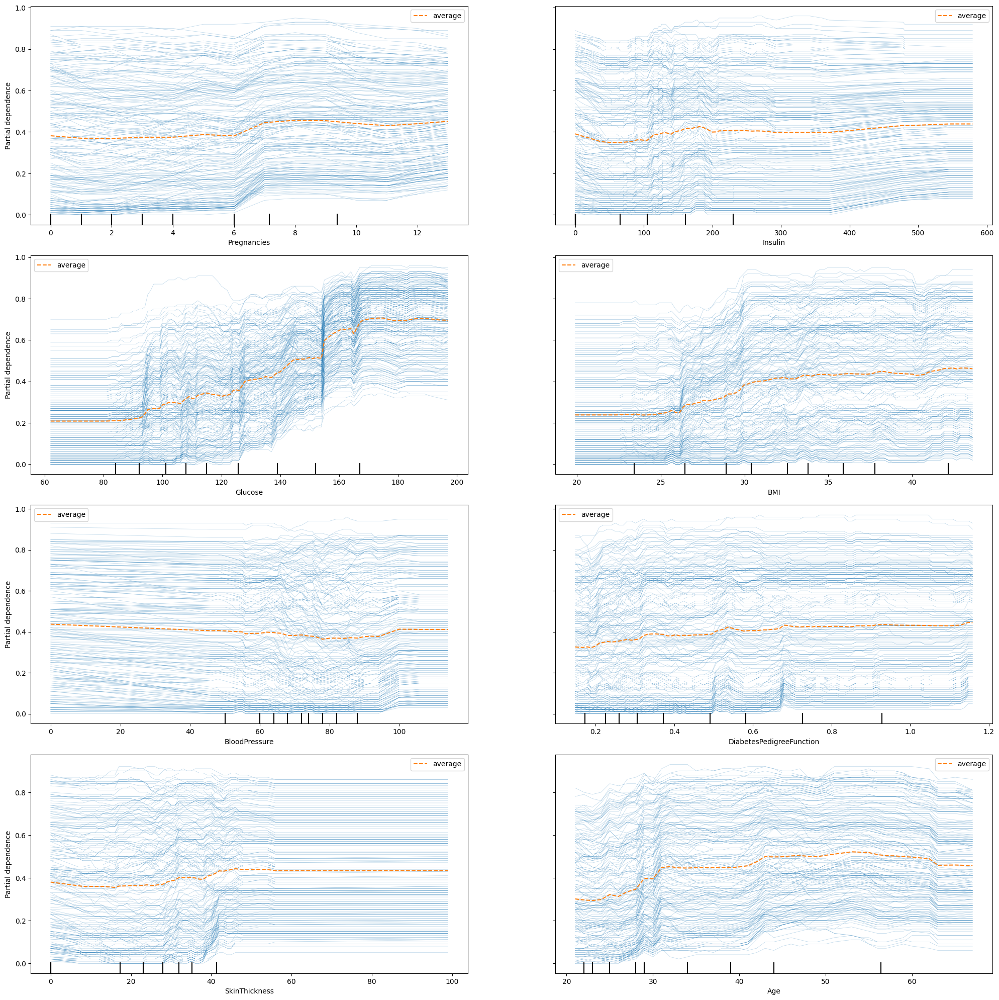

In [77]:
plot_partial_dependence(rf, X_test)

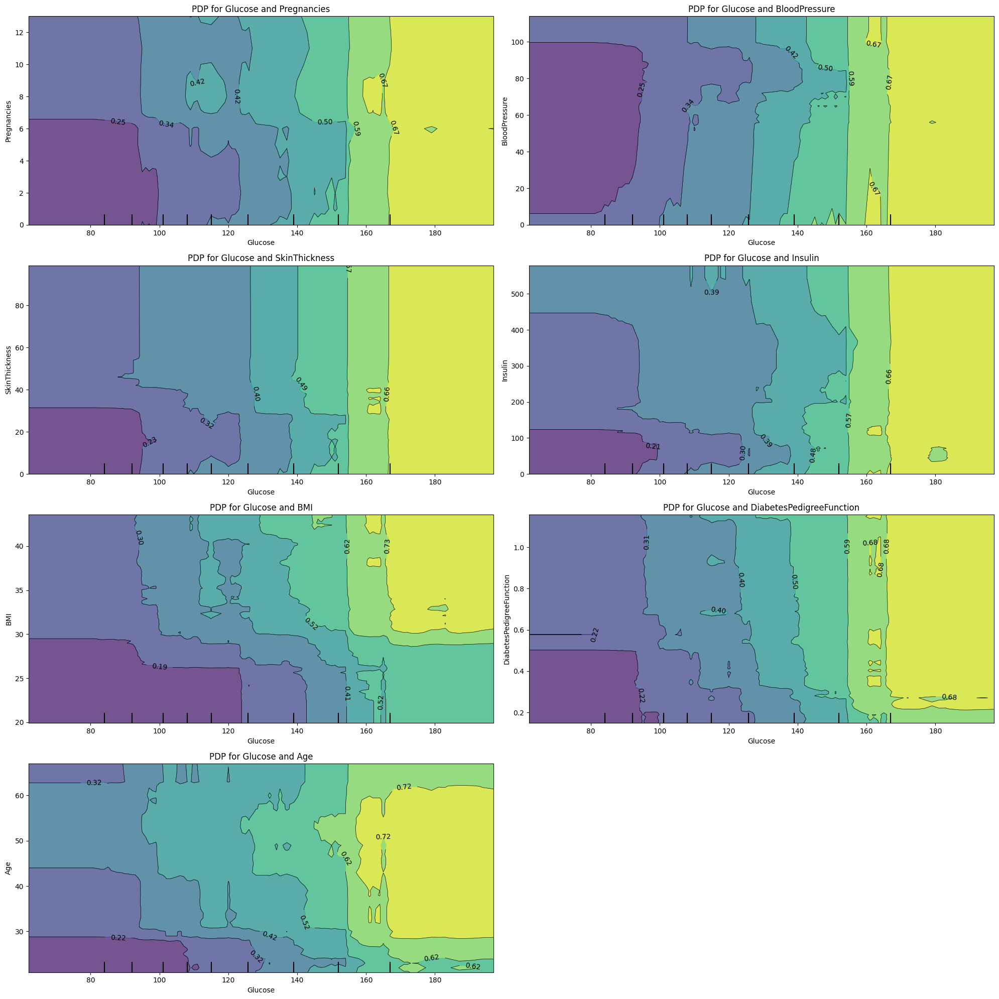

In [82]:
feature_names =  X.columns.tolist() 
plot_pdp_interactions(rf, X_test, 1, feature_names=feature_names)

#### PDPs for the KNN model

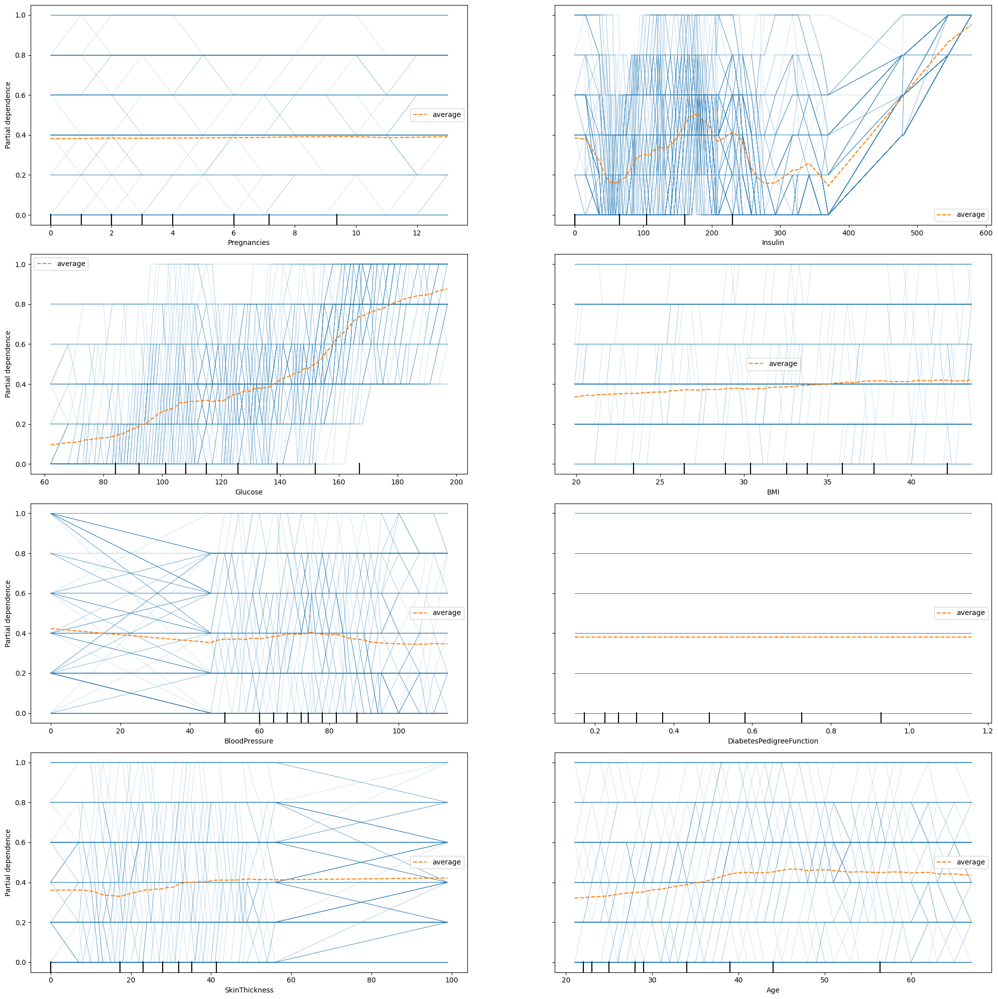

In [85]:
plot_partial_dependence(neigh, X_test)

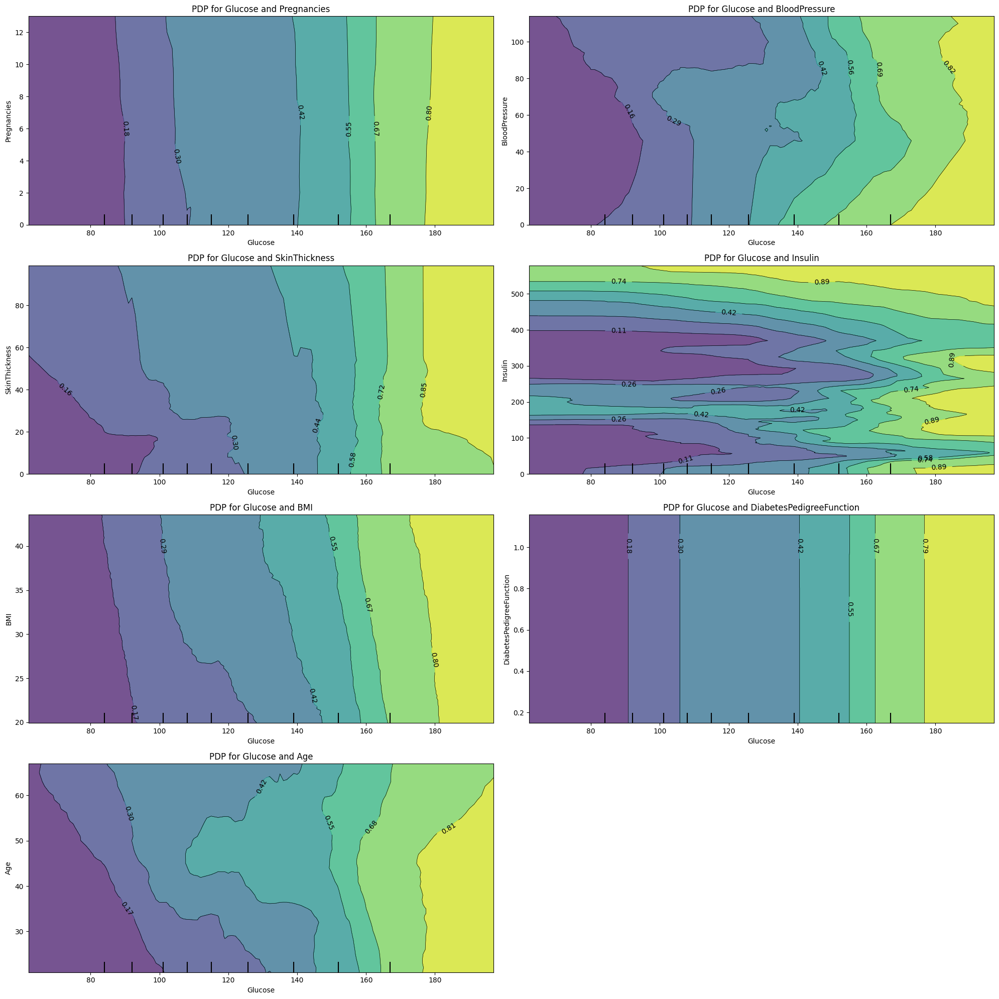

In [84]:
plot_pdp_interactions(neigh, X_test, 1, feature_names=feature_names)

##### Upsampled Results KNN

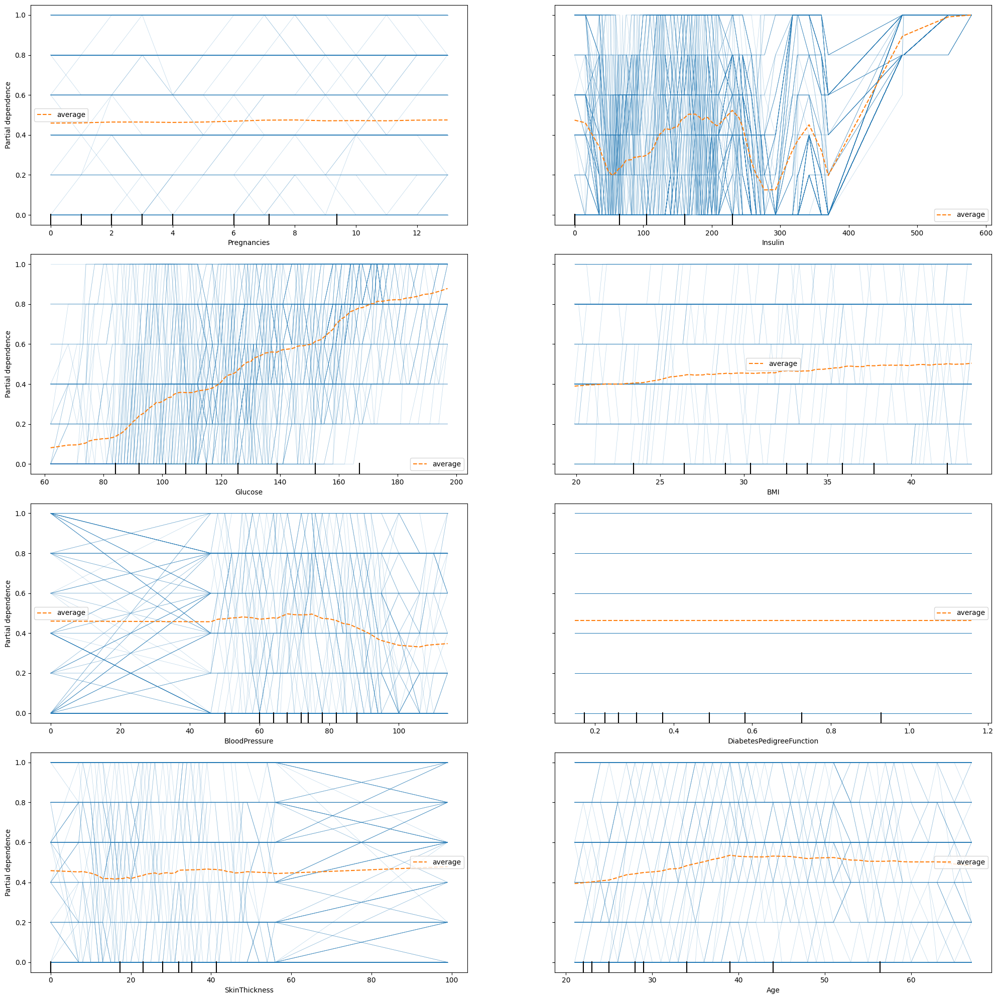

In [86]:
plot_partial_dependence(upsampled_neigh, X_test)

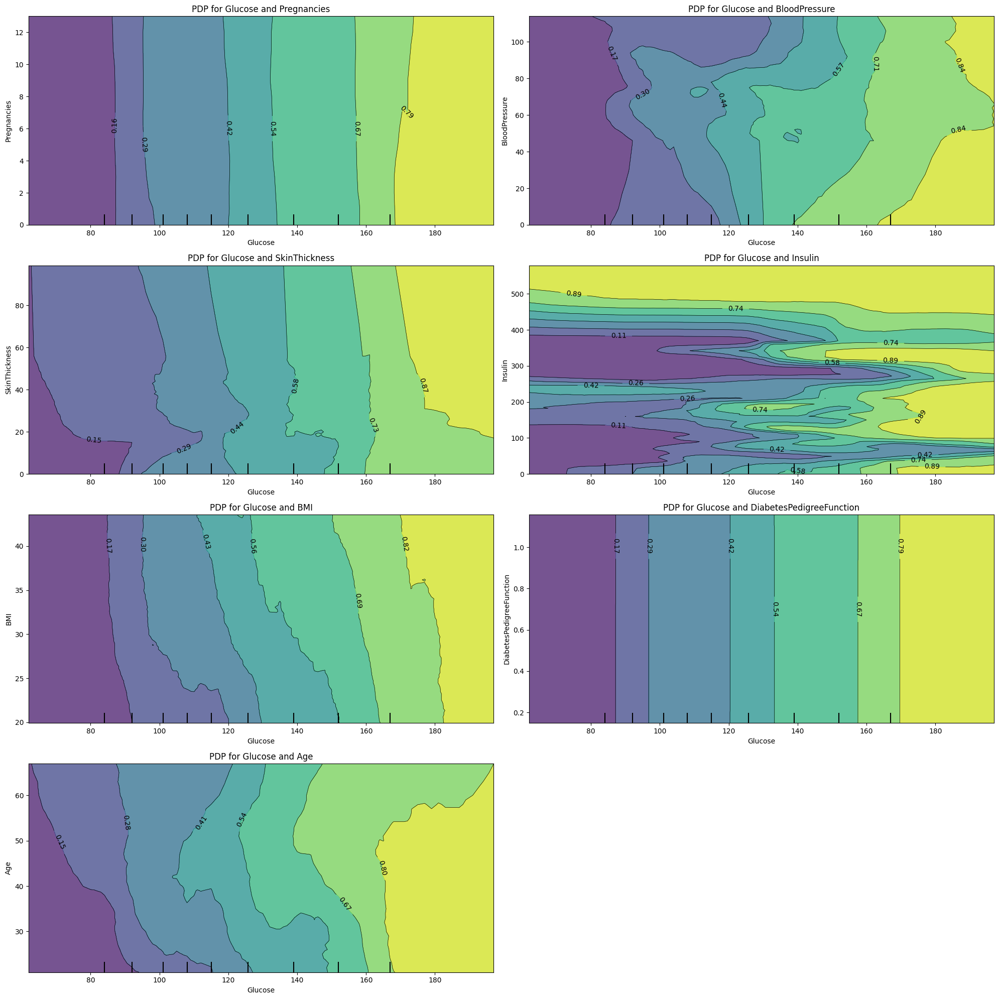

In [87]:
plot_pdp_interactions(upsampled_neigh, X_test, 1, feature_names=feature_names)

#### PDPs for SVM

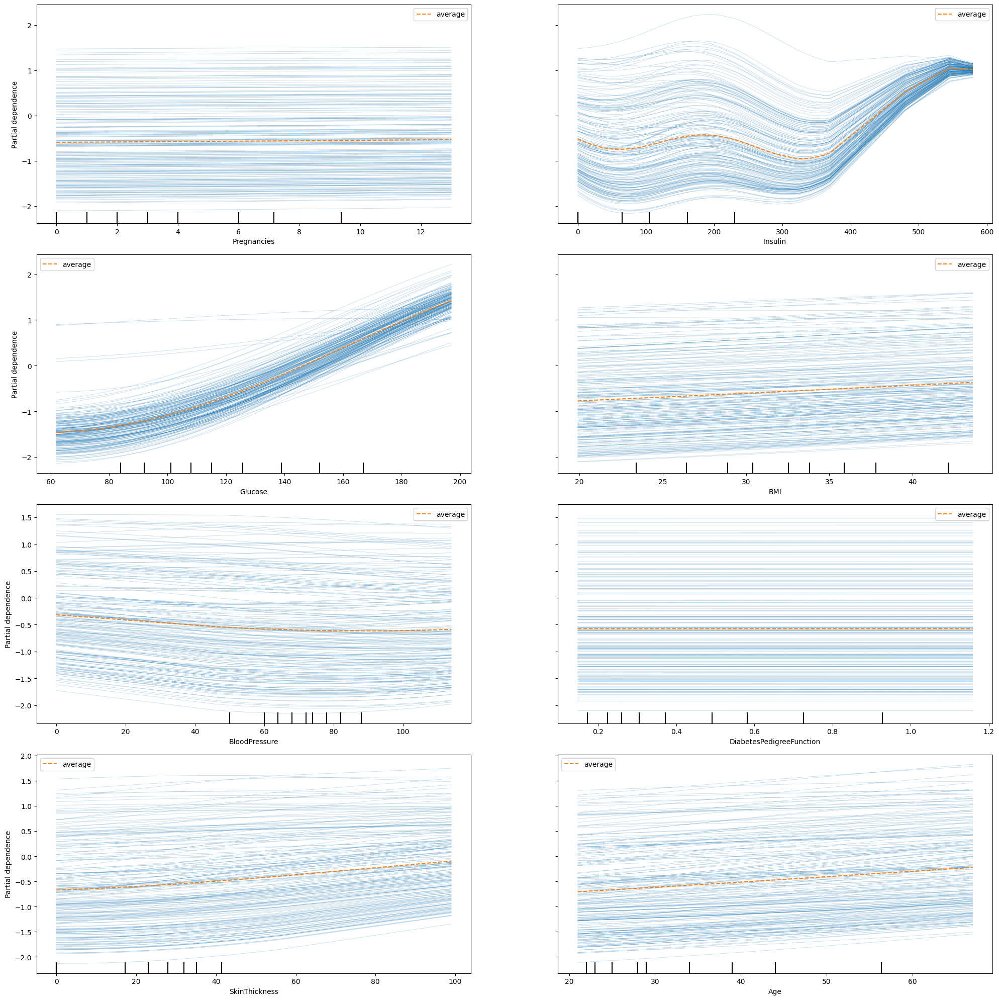

In [88]:
plot_partial_dependence(svm, X_test)

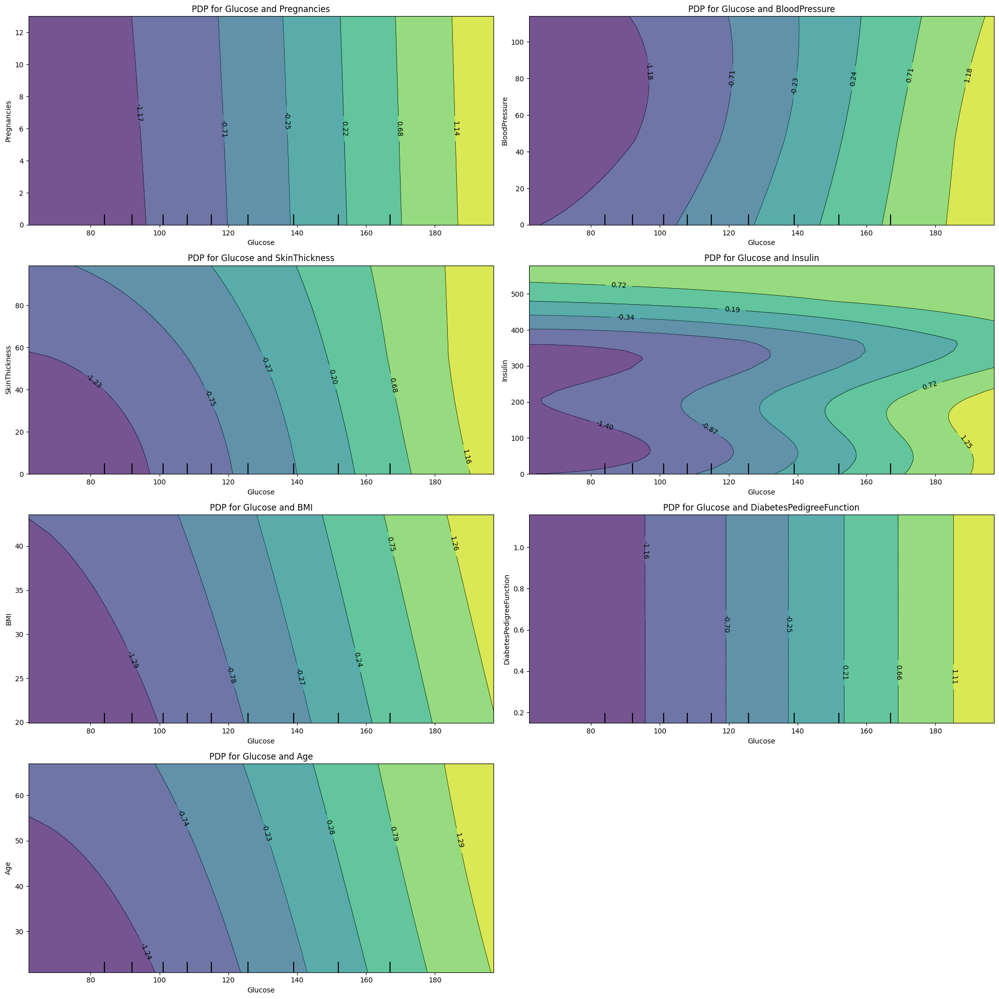

In [89]:
plot_pdp_interactions(svm, X_test, 1, feature_names=feature_names)

##### Upsampled Results SVM

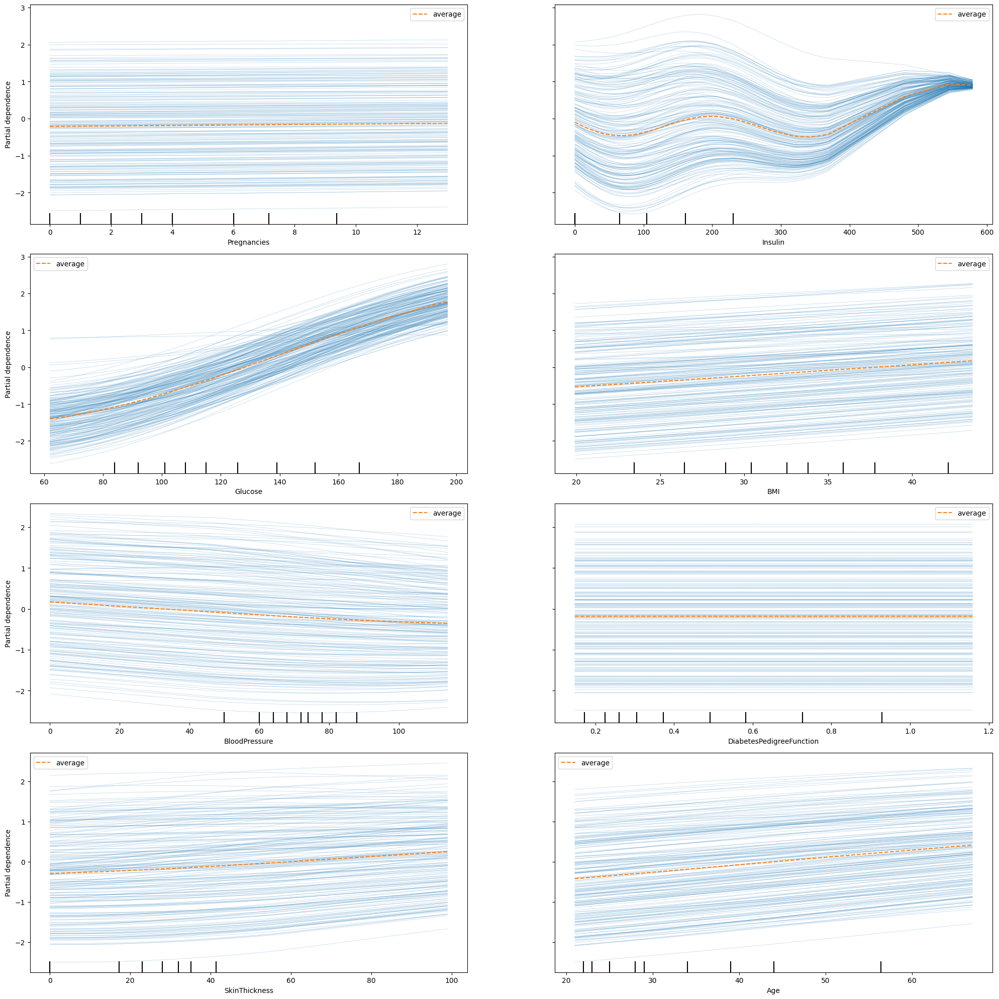

In [92]:
plot_partial_dependence(upsampled_svm, X_test)

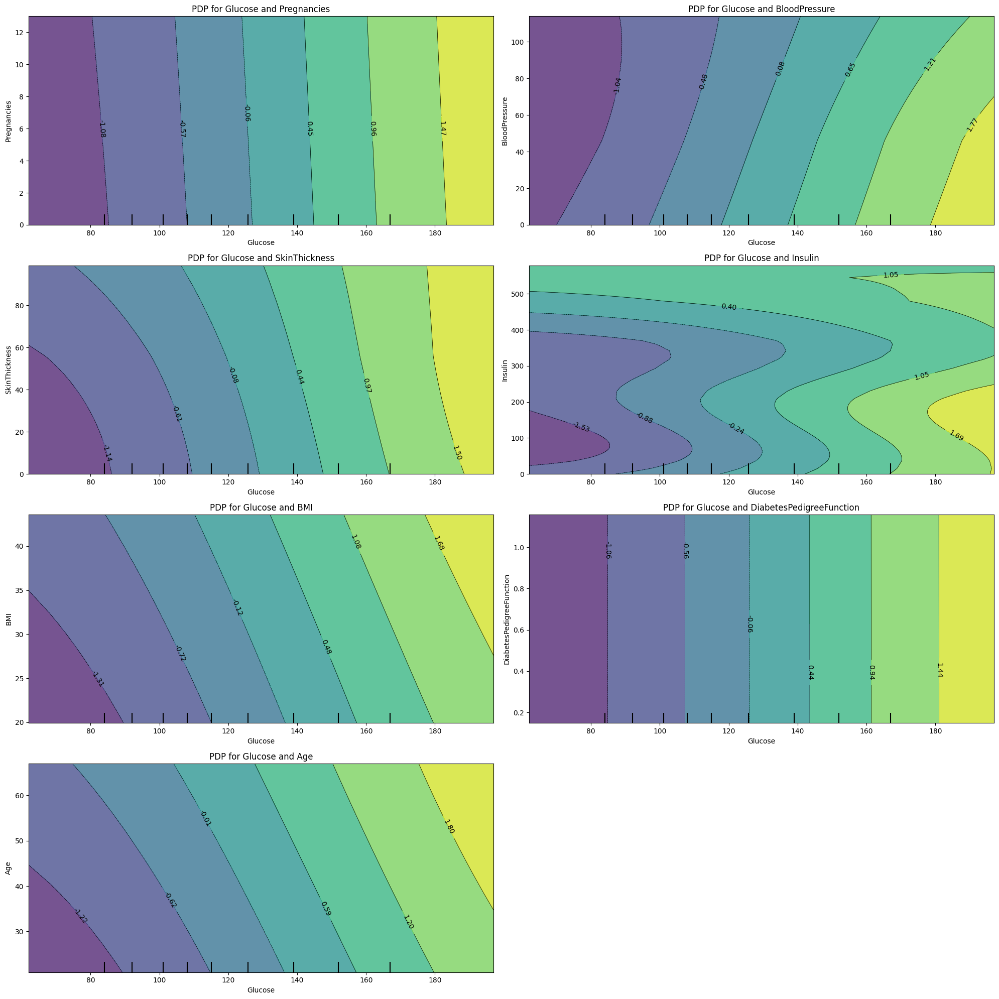

In [93]:
plot_pdp_interactions(upsampled_svm, X_test, 1, feature_names=feature_names)

#### PDPs for LogisticRegression

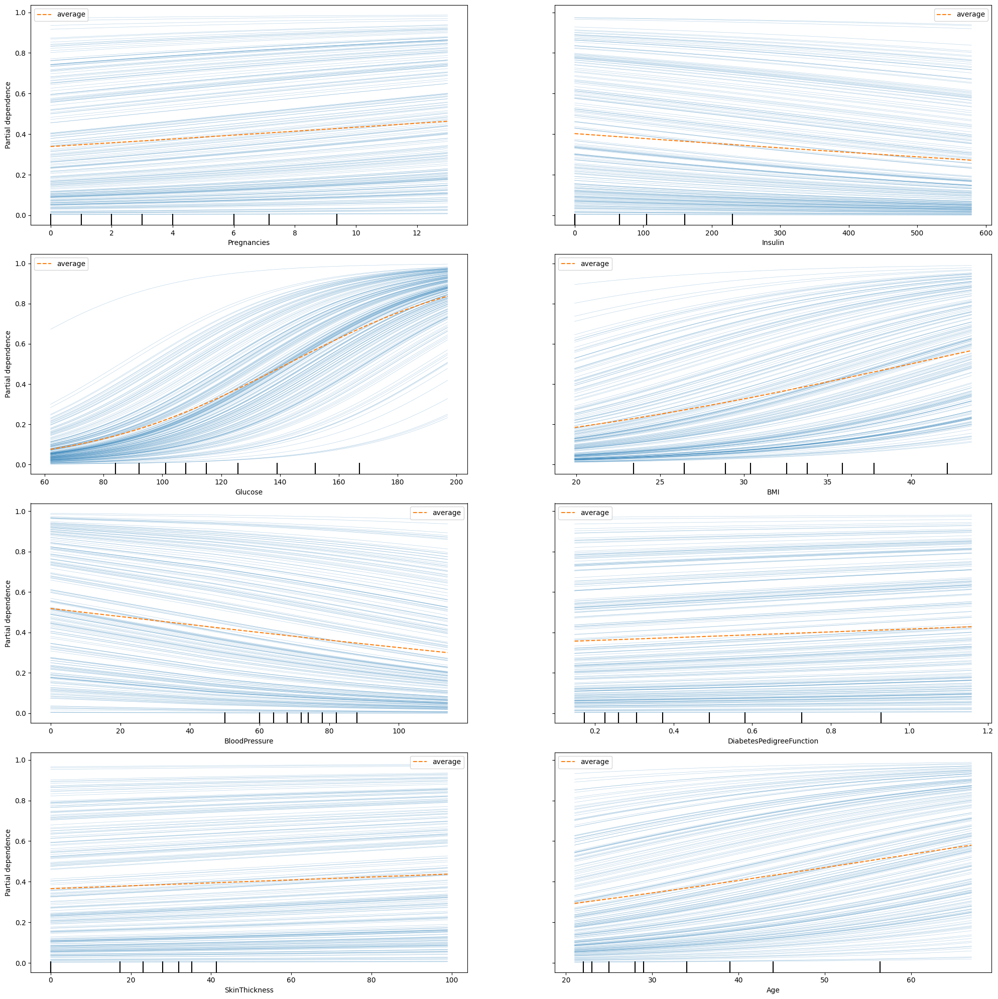

In [90]:
plot_partial_dependence(log_reg, X_test)

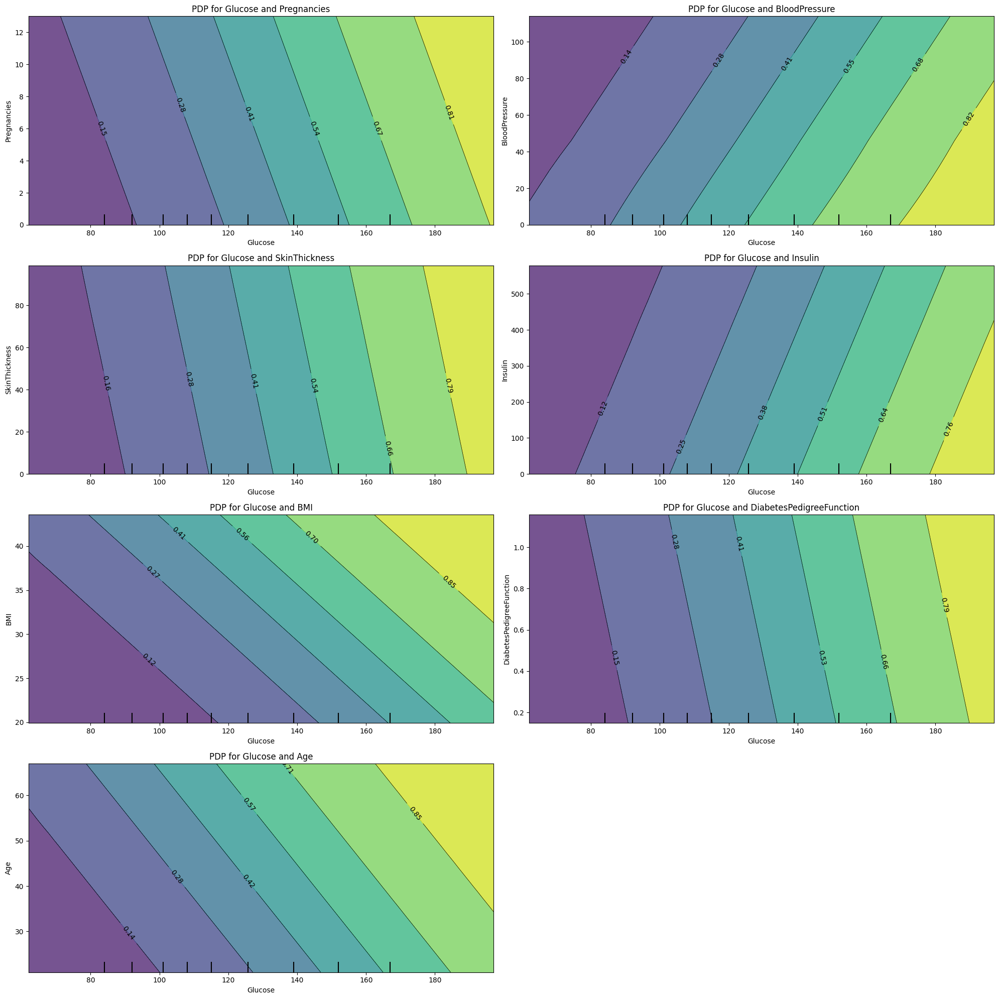

In [91]:
plot_pdp_interactions(log_reg, X_test, 1, feature_names=feature_names)

##### Upsampled results LogisticRegression

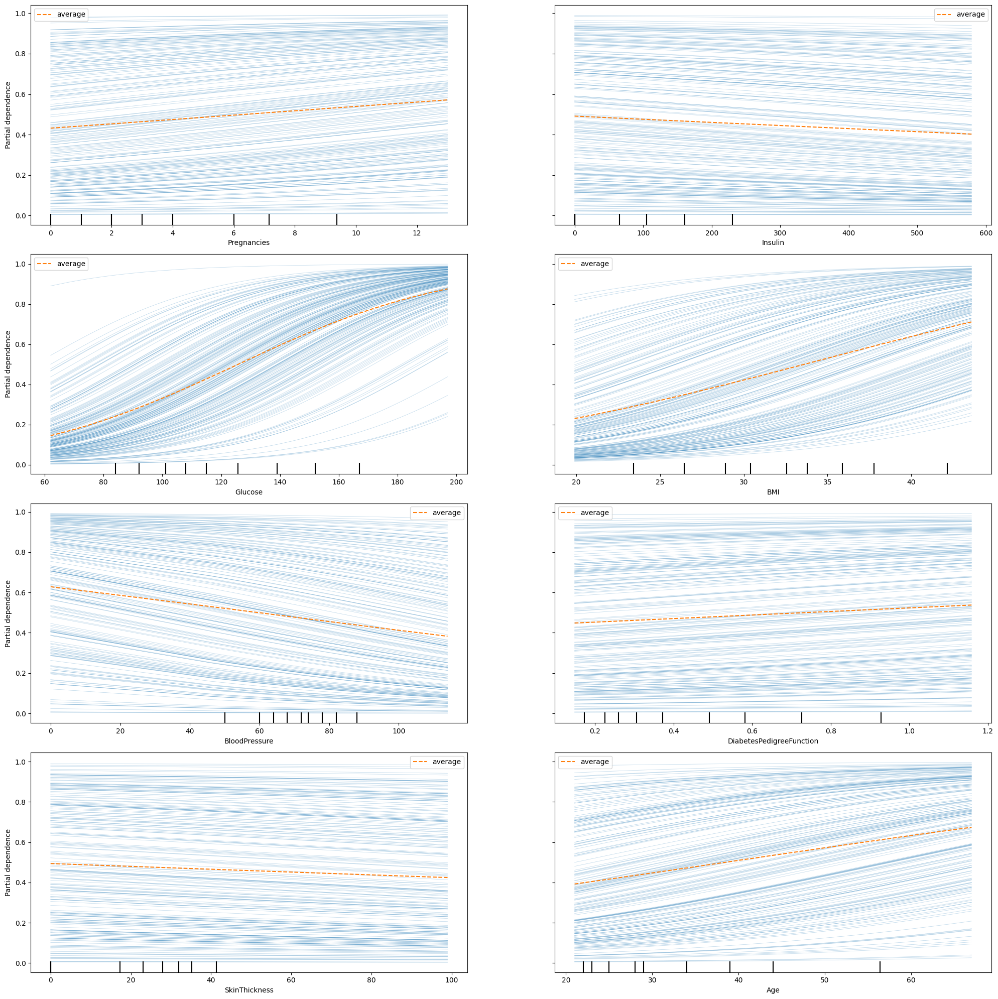

In [94]:
plot_partial_dependence(upsampled_log_reg, X_test)

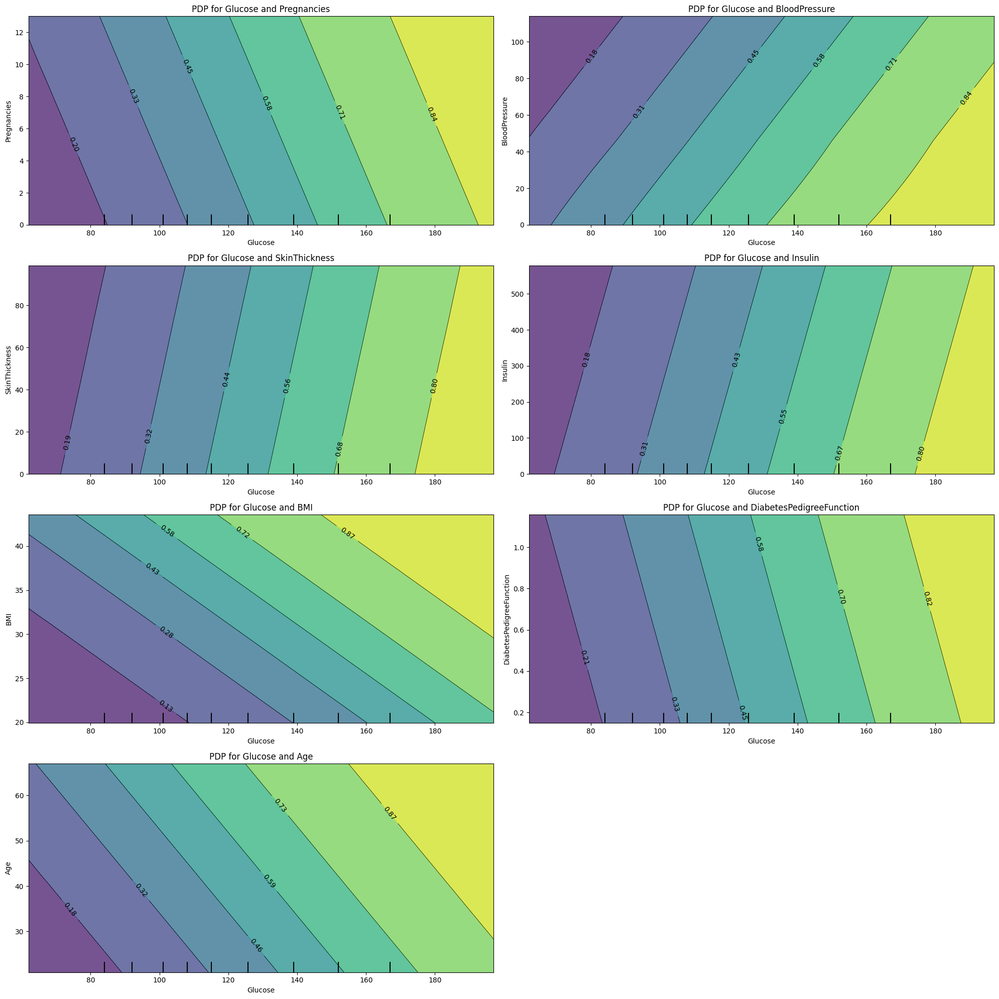

In [95]:
plot_pdp_interactions(upsampled_log_reg, X_test, 1, feature_names=feature_names)